In [25]:
import os 
import geopandas as gp
import xarray as xr
import numpy as np
import geopandas as gp
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.animation as animation

from rasterio import features
from affine import Affine
from IPython.display import HTML


### Download the ssebop ET data for the cv watershed bbox, and put it in the "../data" folder

https://cida.usgs.gov/thredds/ncss/ssebopeta/monthly?var=et&north=42.432488&west=-123.097574&east=-117.980824&south=34.775165&disableProjSubset=on&horizStride=1&time_start=2000-01-01T00%3A00%3A00Z&time_end=2019-10-01T00%3A00%3A00Z&timeStride=1


In [2]:
files = [os.path.join("../data",x) for x in os.listdir("../data") if x.endswith("nc")]

In [3]:
files[0]

'../data/SSEBOP.nc'

In [4]:
ds = xr.open_dataset(files[0])

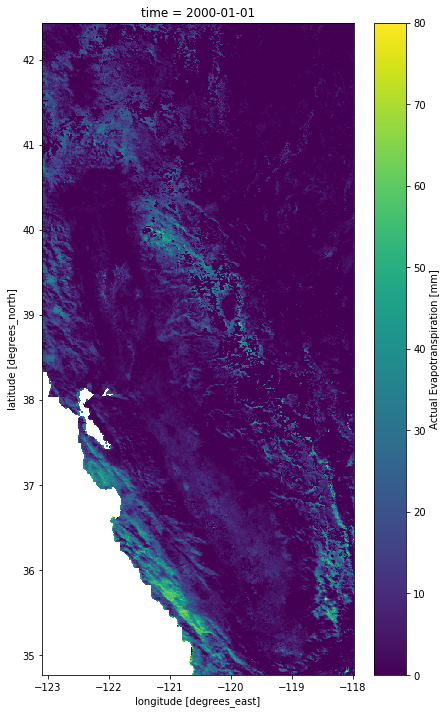

In [5]:
plt.figure(figsize=(7,12))
ds['et'][0].plot()

In [6]:
# Extract the ET data within CV and CVWS shapefiles

cvws = gp.read_file('../shape/cv_hu6.shp')
cv = gp.read_file('../shape/cv.shp')


In [7]:
def transform_from_latlon(lat, lon):
    lat = np.asarray(lat)
    lon = np.asarray(lon)
    trans = Affine.translation(lon[0], lat[0])
    scale = Affine.scale(lon[1] - lon[0], lat[1] - lat[0])
    return trans * scale

def rasterize(shapes, coords, fill=np.nan, **kwargs):
    """Rasterize a list of (geometry, fill_value) tuples onto the given
    xray coordinates. This only works for 1d latitude and longitude
    arrays.
    """
    transform = transform_from_latlon(coords['lat'], coords['lon'])
    out_shape = (len(coords['lat']), len(coords['lon']))
    raster = features.rasterize(shapes, out_shape=out_shape,
                                fill=fill, transform=transform,
                                dtype=float, **kwargs)
    return xr.DataArray(raster, coords=coords, dims=('lat', 'lon'))

In [8]:
ds['cvws'] = rasterize(cvws.geometry, ds['et'][0].coords)
ds['cv'] = rasterize(cv.geometry, ds['et'][0].coords)

cvws_et = ds['et']*ds['cvws']
cv_et = ds['et']*ds['cv']

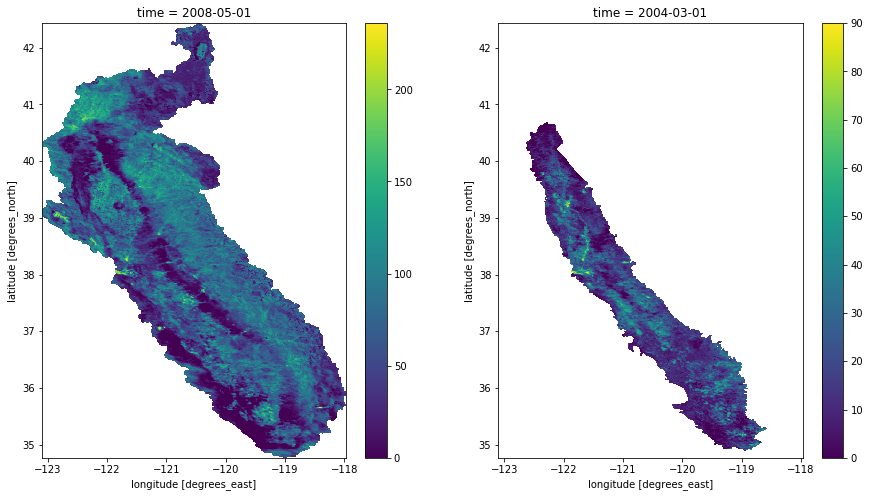

In [9]:
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
cvws_et[100].plot()
plt.subplot(1,2,2)
cv_et[50].plot()

In [10]:
# Get the timeseries, convert mm to km 

dt = pd.date_range(ds.time[0].values, ds.time[-1].values, freq = "MS")

cv_ts= []
for i in cv_et:
    cv_ts.append(i.sum()* 1e-6 )
    
cvws_ts= []
for i in cvws_et:
    cvws_ts.append(i.sum()* 1e-6 )

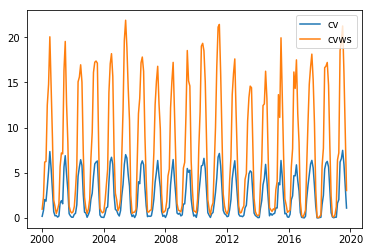

In [11]:
plt.plot(dt,np.array(cv_ts), label = "cv")
plt.plot(dt,np.array(cvws_ts), label = "cvws")
plt.legend()

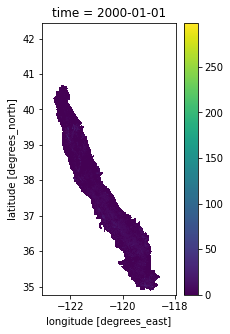

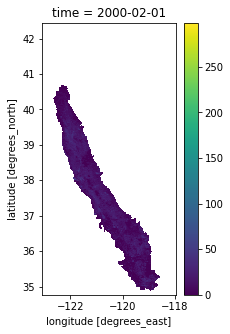

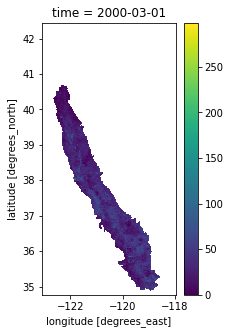

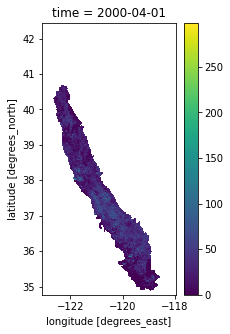

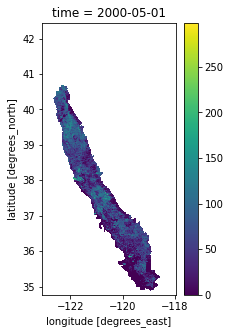

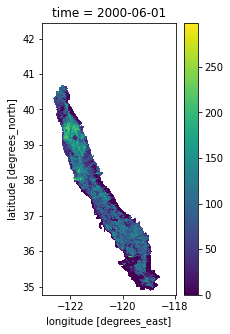

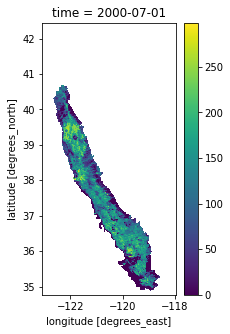

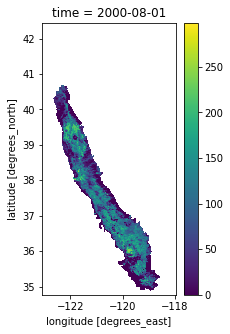

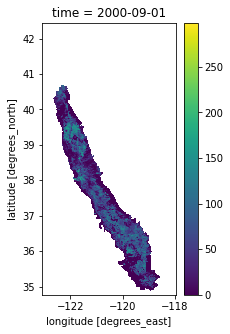

KeyboardInterrupt: 

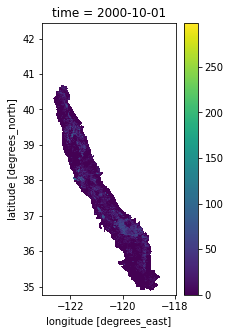

In [22]:
# Animate

vmin=0
vmax=np.nanmax(cv_et)

for i in range(len(cv_ts)):
    plt.figure(figsize = (3,5))
    cv_et[i].plot(vmin = vmin, vmax = vmax)
    plt.savefig("../images/et/cv_et_{}.png".format(str(i)))

/anaconda3/envs/gis/lib/python3.6/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


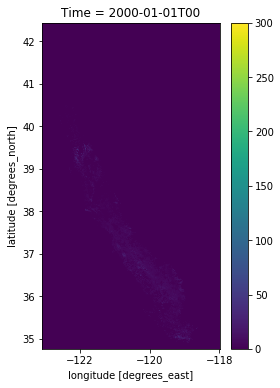

In [32]:
# Get a handle on the figure and the axes
fig, ax = plt.subplots(figsize=(4,6))

# Plot the initial frame. 
cax = cv_et[0,:,:].plot(
    add_colorbar=True,
    vmin=0, vmax=300,
    cbar_kwargs={
        'extend':'neither'
    }
)

# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    cax.set_array(cv_et[frame,:,:].values.flatten())
    ax.set_title("Time = " + str(cv_et.coords['time'].values[frame])[:16])

# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=len(cv_et),       # Could also be iterable or list
    interval=200     # ms between frames
)

HTML(ani.to_jshtml())
